Prerequisits

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import tensorflow as tf
from tensorflow import keras

Settings

In [ ]:
RGB_IMG_HEIGHT = 224
RGB_IMG_WIDTH  = 224
BATCH_SIZE = 16
AUTOTUNE   = tf.data.AUTOTUNE
SEED = 42

tf.random.set_seed(SEED)
np.random.seed(SEED)

Paths

In [ ]:
OWN_DATASET_DIR = Path("/content/drive/MyDrive/Speciale/Own test data set")

MODEL3_FINAL_MODEL = Path(
    "/content/drive/MyDrive/Speciale/Models/Model_3_V3_DINO_RGB_only/final_model.keras"
)

OUTPUT_CSV = OWN_DATASET_DIR / "model_3_v3_dinov2_own_test_predictions.csv"

print("Own dataset folder:", OWN_DATASET_DIR)
print("Model path:", MODEL3_FINAL_MODEL)
print("Output CSV:", OUTPUT_CSV)

Own dataset folder: /content/drive/MyDrive/Speciale/Own test data set
Model path: /content/drive/MyDrive/Speciale/Models/Model_3_V3_DINO_RGB_only/final_model.keras
Output CSV: /content/drive/MyDrive/Speciale/Own test data set/model_3_v3_dinov2_own_test_predictions.csv


Downloading images

In [ ]:
VALID_EXTENSIONS = {".jpg", ".jpeg", ".JPG", ".JPEG"}

rows = []

dish_dirs = sorted([p for p in OWN_DATASET_DIR.iterdir() if p.is_dir()])

for dish_dir in dish_dirs:
    image_files = sorted([
        p for p in dish_dir.iterdir()
        if p.is_file() and p.suffix in VALID_EXTENSIONS
    ])

    if len(image_files) == 0:
        print(f"Skipping {dish_dir.name}: no JPG image found")
        continue

    if len(image_files) > 1:
        print(f"Warning: {dish_dir.name} has multiple images. Using {image_files[0].name}")

    rows.append({
        "dish_id": dish_dir.name,
        "rgb_path": str(image_files[0]),
        "image_name": image_files[0].name
    })

own_test_df = pd.DataFrame(rows)

print(f"Found {len(own_test_df)} dishes")
display(own_test_df)

Found 62 dishes


,dish_id,rgb_path,image_name
0,Dish_0001,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0130.jpeg
1,Dish_0002,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0139.jpeg
2,Dish_0003,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0148.jpg
3,Dish_0004,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0158.jpg
4,Dish_0005,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0192.jpg
...,...,...,...
57,Dish_0058,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0354.jpg
58,Dish_0059,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0355.jpg
59,Dish_0060,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0356.jpg
60,Dish_0061,/content/drive/MyDrive/Speciale/Own test data ...,IMG_0357.jpg


In [ ]:
def load_rgb_image(rgb_path):
    image = tf.io.read_file(rgb_path)
    image = tf.image.decode_jpeg(image, channels=3)

    image = tf.image.resize_with_pad(
        image,
        target_height=RGB_IMG_HEIGHT,
        target_width=RGB_IMG_WIDTH,
        method=tf.image.ResizeMethod.BILINEAR,
        antialias=True
    )

    image = tf.cast(image, tf.float32)
    return image


def load_rgb_for_prediction(rgb_path):
    rgb = load_rgb_image(rgb_path)
    return {"rgb_input": rgb}


def make_rgb_prediction_dataset(dataframe, batch_size=BATCH_SIZE):
    rgb_paths = dataframe["rgb_path"].astype(str).values

    ds = tf.data.Dataset.from_tensor_slices(rgb_paths)
    ds = ds.map(load_rgb_for_prediction, num_parallel_calls=AUTOTUNE)
    ds = ds.batch(batch_size)
    ds = ds.prefetch(AUTOTUNE)
    return ds

In [ ]:
own_rgb_dataset = make_rgb_prediction_dataset(own_test_df, batch_size=BATCH_SIZE)

for batch_inputs in own_rgb_dataset.take(1):
    print("Input keys:", batch_inputs.keys())
    print("RGB shape:", batch_inputs["rgb_input"].shape)

Input keys: dict_keys(['rgb_input'])
RGB shape: (16, 224, 224, 3)


Loading model in

In [ ]:
if MODEL3_FINAL_MODEL.exists():
    print("Loading RGB transformer from:", MODEL3_FINAL_MODEL)
    rgb_carb_model = keras.models.load_model(MODEL3_FINAL_MODEL)
else:
    raise FileNotFoundError(f"Could not find Model 3 V3 model at: {MODEL3_FINAL_MODEL}")

Loading RGB transformer from: /content/drive/MyDrive/Speciale/Models/Model_3_V3_DINO_RGB_only/final_model.keras


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 896 variables whereas the saved optimizer has 886 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Creating prediction

In [ ]:
preds = rgb_carb_model.predict(own_rgb_dataset, verbose=1).reshape(-1)

own_test_df["predicted_carb_g"] = preds

display(own_test_df[["dish_id", "image_name", "predicted_carb_g"]])

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: {'images': 'images'}
Received: inputs=Tensor(shape=(16, 224, 224, 3))
  warnings.warn(msg)


3/4 ━━━━━━━━━━━━━━━━━━━━ 4s 5s/step

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: {'images': 'images'}
Received: inputs=Tensor(shape=(None, 224, 224, 3))
  warnings.warn(msg)


4/4 ━━━━━━━━━━━━━━━━━━━━ 33s 7s/step


,dish_id,image_name,predicted_carb_g
0,Dish_0001,IMG_0130.jpeg,50.170929
1,Dish_0002,IMG_0139.jpeg,36.032814
2,Dish_0003,IMG_0148.jpg,3.953832
3,Dish_0004,IMG_0158.jpg,18.204813
4,Dish_0005,IMG_0192.jpg,36.296501
...,...,...,...
57,Dish_0058,IMG_0354.jpg,28.021189
58,Dish_0059,IMG_0355.jpg,90.505791
59,Dish_0060,IMG_0356.jpg,106.218842
60,Dish_0061,IMG_0357.jpg,42.275135


Saving prediction

In [ ]:
own_test_df.to_csv(OUTPUT_CSV, index=False)

print(f"Saved predictions to: {OUTPUT_CSV}")

Saved predictions to: /content/drive/MyDrive/Speciale/Own test data set/model_3_v3_dinov2_own_test_predictions.csv


Visualizing all predictions

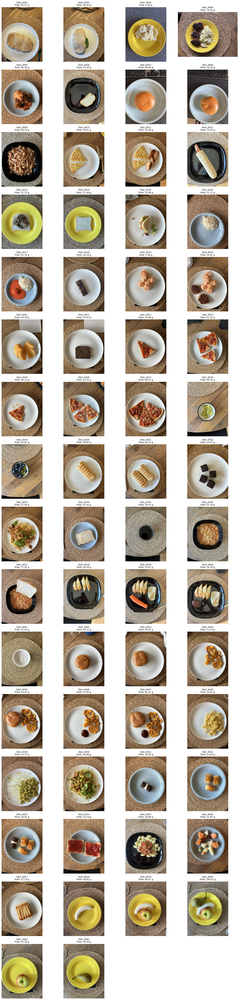

In [ ]:
n = len(own_test_df)
cols = 4
rows = int(np.ceil(n / cols))

plt.figure(figsize=(cols * 4, rows * 4))

for i, (_, row) in enumerate(own_test_df.iterrows(), start=1):
    img = Image.open(row["rgb_path"]).convert("RGB")

    plt.subplot(rows, cols, i)
    plt.imshow(img)
    plt.axis("off")
    plt.title(
        f"{row['dish_id']}\nPred: {row['predicted_carb_g']:.2f} g",
        fontsize=10
    )

plt.tight_layout()
plt.show()

Heatmap of the dishes

In [ ]:
!pip install -q keras-hub

In [ ]:
import math
import keras_hub
from tensorflow.keras import layers

keras.backend.clear_session()
tf.config.optimizer.set_jit(False)

print("TensorFlow version:", tf.__version__)
print("XLA disabled.")

TensorFlow version: 2.20.0
XLA disabled.


In [ ]:
IMG_HEIGHT = RGB_IMG_HEIGHT
IMG_WIDTH  = RGB_IMG_WIDTH

BACKBONE_PRESET = "dinov2_large"

OUTPUT_DIR = Path("/content/drive/MyDrive/Speciale/Models/Model_3_V3_DINO_RGB_only")
WEIGHTS_PATH = OUTPUT_DIR / "best_model_stage2.weights.h5"

print("Weights path:", WEIGHTS_PATH)
print("Weights exist:", WEIGHTS_PATH.exists())

Weights path: /content/drive/MyDrive/Speciale/Models/Model_3_V3_DINO_RGB_only/best_model_stage2.weights.h5
Weights exist: True


In [ ]:
image_converter = keras_hub.layers.ImageConverter.from_preset(
    BACKBONE_PRESET,
    image_size=(IMG_HEIGHT, IMG_WIDTH),
)

backbone = keras_hub.models.Backbone.from_preset(
    BACKBONE_PRESET,
    image_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
)

backbone.trainable = False


def extract_backbone_tensor(x):
    if isinstance(x, dict):
        preferred_keys = [
            "sequence_output",
            "pooled_output",
            "encoder_output",
            "token_embeddings",
            "hidden_states"
        ]
        for key in preferred_keys:
            if key in x:
                return x[key]
        return list(x.values())[0]

    return x


rgb_input = keras.Input(shape=(IMG_HEIGHT, IMG_WIDTH, 3), name="rgb_input")

x = image_converter(rgb_input)
x = backbone(x)
token_tensor = extract_backbone_tensor(x)

x = token_tensor

if len(x.shape) == 3:
    x = layers.LayerNormalization()(x)
    x = layers.GlobalAveragePooling1D(name="token_pool")(x)
else:
    x = layers.LayerNormalization()(x)
    x = layers.Flatten()(x)

x = layers.Dropout(0.3)(x)
x = layers.Dense(256, activation="relu", name="dense_256")(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(64, activation="relu", name="dense_64")(x)
output = layers.Dense(1, activation="linear", name="carb_output")(x)

heatmap_model = keras.Model(
    inputs={"rgb_input": rgb_input},
    outputs=output,
    name="rgb_only_dino_vit_regressor"
)

cam_model = keras.Model(
    inputs={"rgb_input": rgb_input},
    outputs=[token_tensor, output],
    name="cam_model"
)

heatmap_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss="mse",
    metrics=[
        keras.metrics.MeanAbsoluteError(name="mae"),
        keras.metrics.MeanSquaredError(name="mse")
    ],
    jit_compile=False
)

heatmap_model.load_weights(str(WEIGHTS_PATH))

print("Heatmap model rebuilt.")
print("Weights loaded successfully.")

100%|██████████| 782/782 [00:00<00:00, 1.65MB/s]


100%|██████████| 977/977 [00:00<00:00, 2.19MB/s]


100%|██████████| 1.14G/1.14G [00:28<00:00, 43.4MB/s]


Heatmap model rebuilt.
Weights loaded successfully.


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 886 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [ ]:
def display_image(img):
    img = img.numpy() if isinstance(img, tf.Tensor) else img
    img = img.astype("float32")

    if img.max() > 1.5:
        img = img / 255.0

    return np.clip(img, 0, 1)


def infer_patch_grid(num_tokens):
    """
    DINOv2 ViT outputs patch tokens plus possible special tokens.
    This tries to infer whether there are 0, 1, or 2 special tokens.
    """
    for special_tokens in [2, 1, 0]:
        patch_count = num_tokens - special_tokens
        grid_size = int(math.sqrt(patch_count))

        if grid_size * grid_size == patch_count:
            return special_tokens, grid_size

    raise ValueError(f"Could not infer patch grid from {num_tokens} tokens.")


def get_heatmap_model_prediction(img_tensor):
    pred = heatmap_model({"rgb_input": img_tensor}, training=False)
    return float(pred.numpy()[0, 0])


def make_clean_heatmap(img_tensor):
    """
    Grad-CAM-style heatmap for DINOv2 patch tokens.
    """
    img_tensor = tf.cast(img_tensor, tf.float32)

    with tf.GradientTape() as tape:
        token_output, prediction = cam_model(
            {"rgb_input": img_tensor},
            training=False
        )

        score = prediction[:, 0]

    grads = tape.gradient(score, token_output)

    if grads is None:
        raise ValueError(
            "Gradients are None. token_output is not connected to prediction."
        )

    tokens = token_output[0]
    grads = grads[0]

    num_tokens = int(tokens.shape[0])
    num_special, grid_size = infer_patch_grid(num_tokens)

    patch_tokens = tokens[num_special:]
    patch_grads = grads[num_special:]

    weights = tf.reduce_mean(patch_grads, axis=0)

    cam = tf.reduce_sum(patch_tokens * weights, axis=-1)
    cam = tf.nn.relu(cam)

    cam = cam.numpy().reshape(grid_size, grid_size)

    cam = cam - cam.min()
    if cam.max() > 0:
        cam = cam / cam.max()

    cam = tf.image.resize(
        cam[..., None],
        size=(IMG_HEIGHT, IMG_WIDTH),
        method="bicubic"
    ).numpy().squeeze()

    cam_tf = tf.convert_to_tensor(cam[None, ..., None], dtype=tf.float32)
    cam_tf = tf.nn.avg_pool2d(
        cam_tf,
        ksize=9,
        strides=1,
        padding="SAME"
    )
    cam = cam_tf[0, ..., 0].numpy()

    cam = cam - cam.min()
    if cam.max() > 0:
        cam = cam / cam.max()

    return cam


def overlay_heatmap(img_disp, heatmap, alpha=0.45, cmap_name="jet"):
    cmap = plt.get_cmap(cmap_name)
    heatmap_rgb = cmap(heatmap)[..., :3]

    overlay = (1 - alpha) * img_disp + alpha * heatmap_rgb
    overlay = np.clip(overlay, 0, 1)

    return overlay

In [ ]:
def visualize_own_dish_heatmap(df, dish_id=None, row_idx=None, alpha=0.45, save_path=None):
    """
    Visualizes one own-test-dataset dish with:
    - original image
    - carbohydrate heatmap
    - overlay

    Use either dish_id, e.g. "Dish_0054", or row_idx.
    """

    if dish_id is not None:
        matches = df[df["dish_id"].astype(str) == str(dish_id)]

        if len(matches) == 0:
            raise ValueError(f"Dish ID not found: {dish_id}")

        row = matches.iloc[0]

    elif row_idx is not None:
        row = df.iloc[row_idx]

    else:
        raise ValueError("Provide either dish_id or row_idx.")

    rgb_path = row["rgb_path"]
    dish = row["dish_id"]

    img = load_rgb_image(rgb_path)
    img_tensor = tf.expand_dims(img, axis=0)

    pred = get_heatmap_model_prediction(img_tensor)

    img_disp = display_image(img)
    heatmap = make_clean_heatmap(img_tensor)
    overlay = overlay_heatmap(img_disp, heatmap, alpha=alpha)

    fig, axes = plt.subplots(1, 3, figsize=(13, 4))

    axes[0].imshow(img_disp)
    axes[0].set_title("Image")
    axes[0].axis("off")

    axes[1].imshow(heatmap, cmap="jet", vmin=0, vmax=1)
    axes[1].set_title("Carb heatmap")
    axes[1].axis("off")

    axes[2].imshow(overlay)
    axes[2].set_title("Overlay")
    axes[2].axis("off")

    plt.suptitle(
        f"{dish} | Predicted carbs: {pred:.2f} g",
        fontsize=13
    )

    plt.tight_layout()

    if save_path is not None:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
        print("Saved figure to:", save_path)

    plt.show()

    print("Dish:", dish)
    print("RGB path:", rgb_path)
    print("Predicted carbs:", pred)

/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: {'images': 'images'}
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


Saved figure to: /content/drive/MyDrive/Speciale/Own test data set/Dish_0026_model_3_v3_heatmap.png


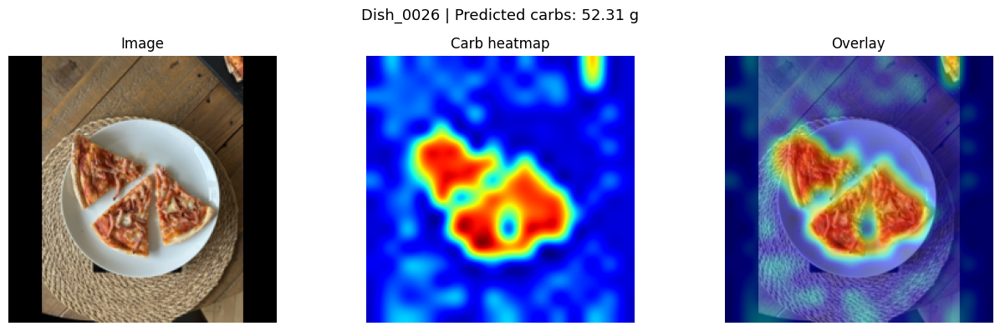

Dish: Dish_0026
RGB path: /content/drive/MyDrive/Speciale/Own test data set/Dish_0026/IMG_0321.jpg
Predicted carbs: 52.31233596801758


In [ ]:
SELECTED_DISH_ID = "Dish_0026"

visualize_own_dish_heatmap(
    own_test_df,
    dish_id=SELECTED_DISH_ID,
    alpha=0.45,
    save_path=str(OWN_DATASET_DIR / f"{SELECTED_DISH_ID}_model_3_v3_heatmap.png")
)